<a href="https://colab.research.google.com/github/Eliasmarcet91/elephant/blob/master/Elepharn_binary_classifier_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle (1).json


In [2]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [3]:
!kaggle datasets download -d vivmankar/asian-vs-african-elephant-image-classification

Dataset URL: https://www.kaggle.com/datasets/vivmankar/asian-vs-african-elephant-image-classification
License(s): CC0-1.0
asian-vs-african-elephant-image-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [4]:
!unzip asian-vs-african-elephant-image-classification.zip

Archive:  asian-vs-african-elephant-image-classification.zip
replace dataset/test/African/af_te1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [5]:
# Identify any bad images
import os
from PIL import Image

def validate_images(directory):
    corrupted_files = []

    # Walk through directory and sub-directories
    for dirpath, _, filenames in os.walk(directory):
        print(f"Scanning directory: {dirpath}")

        for image_file in filenames:
            # Check for common image extensions
            if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                image_path = os.path.join(dirpath, image_file)
                try:
                    with Image.open(image_path) as img:
                        img.verify()
                except Exception as e:
                    corrupted_files.append(image_path)
                    print(f"Error with {image_path}: {e}")

    return corrupted_files

# Example usage:
directory = "/content/train"  # Code ran against test/train/valid folders to confirm validity
corrupted_images = validate_images(directory)
if corrupted_images:
    print(f"Found {len(corrupted_images)} corrupted images.")
else:
    print("All images are valid!")

All images are valid!


In [6]:
!ls dataset/test/Asian  | wc -l
!ls dataset/train/Asian | wc -l

91
420


#Display random images from the data

Selected random subfolder: /content/dataset/train/African


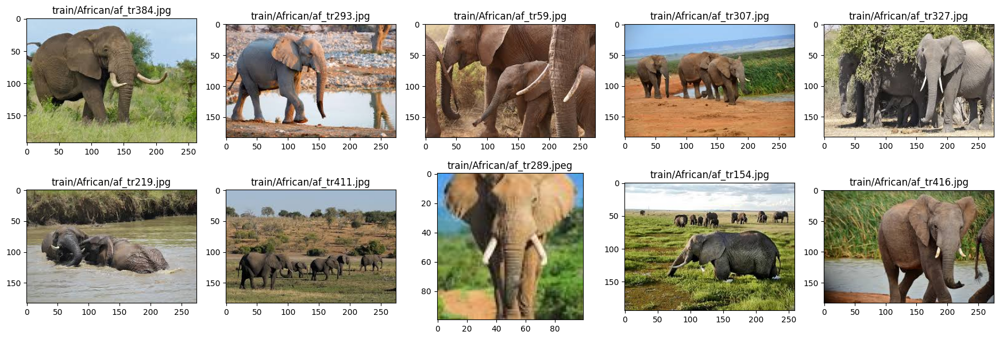

Selected random subfolder: /content/dataset/test/African


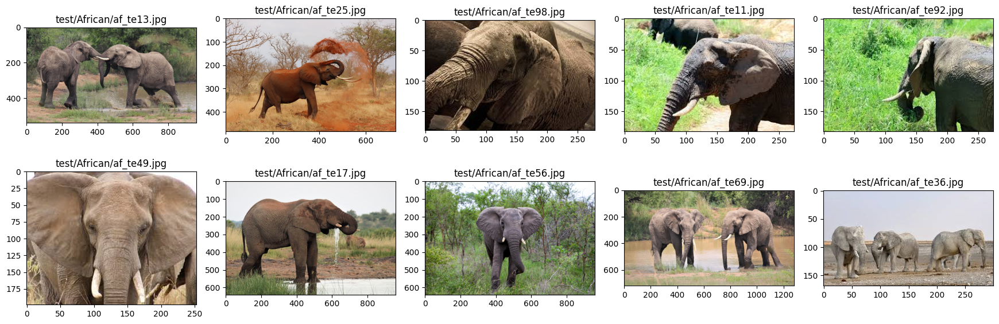

In [7]:
import random
import pathlib
import matplotlib.pyplot as plt

def plot_random_sample(data_dir: pathlib.PosixPath, num_samples=10):
    """
    Randomly selects images from random subfolders in the data directory and plots them.

    :param data_dir: Path to the main data directory containing 'train', 'test', 'val' folders.
    :param num_samples: Number of samples to select from each subfolder.
    """
    # Check if the main data directory exists
    if not data_dir.exists():
        print(f"Data directory {data_dir} does not exist.")
        return

    # Loop over each dataset type: train, test, val
    for dataset_type in ['/content/dataset/train', '/content/dataset/test']:
        dataset_dir = data_dir / dataset_type

        # Check if the dataset directory exists
        if not dataset_dir.exists():
            print(f"{dataset_type} directory {dataset_dir} does not exist.")
            continue

        # Get all subfolders in the current dataset directory
        subfolders = [f for f in dataset_dir.iterdir() if f.is_dir()]

        if not subfolders:
            print(f"No subfolders found in {dataset_dir}")
            continue

        # Select a random subfolder
        random_subfolder = random.choice(subfolders)
        print(f"Selected random subfolder: {random_subfolder}")

        # Get all image files in the selected subfolder
        image_files = [f for f in random_subfolder.iterdir() if f.is_file() and f.suffix in ['.jpg', '.jpeg', '.png']]

        if not image_files:
            print(f"No images found in subfolder {random_subfolder}")
            continue

        # Select random samples from the image files
        random_samples = random.sample(image_files, min(num_samples, len(image_files)))

        # Define number of rows and columns for the plot
        num_row = 2
        num_col = 5

        # Create a figure
        fig, axes = plt.subplots(num_row, num_col, figsize=(3.5 * num_col, 3 * num_row))
        # For every image
        for i in range(num_row * num_col):
            if i < len(random_samples):
                # Read the image
                img = plt.imread(str(random_samples[i]))
                # Display the image
                ax = axes[i // num_col, i % num_col]
                ax.imshow(img)
                # Set title as <train|test|validation>/<cat\dog>/<img_name>.jpg
                ax.set_title('/'.join(random_samples[i].parts[-3:]))
            else:
                axes[i // num_col, i % num_col].axis('off')

        plt.tight_layout()
        plt.show()

# Example usage
data_directory = pathlib.Path('/content/dataset/train/')
plot_random_sample(data_directory)


In [8]:
import os
import pathlib
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
tf.random.set_seed(42)

from PIL import Image, ImageOps
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

In [9]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

def plot_image(img: np.array):
    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap='gray');

def plot_two_images(img1: np.array, img2: np.array):
    _, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(img1, cmap='gray')
    ax[1].imshow(img2, cmap='gray');

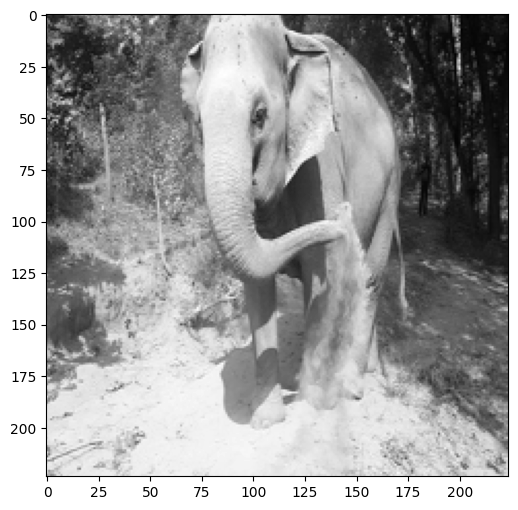

In [10]:
img = Image.open('/content/dataset/test/Asian/as_te1.jpg')
img = ImageOps.grayscale(img)
img = img.resize(size=(224, 224))
plot_image(img=img)

In [11]:
def get_pools(img: np.array, pool_size: int, stride: int) -> np.array:
    # To store individual pools
    pools = []

    # Iterate over all row blocks (single block has `stride` rows)
    for i in np.arange(img.shape[0], step=stride):
        # Iterate over all column blocks (single block has `stride` columns)
        for j in np.arange(img.shape[0], step=stride):

            # Extract the current pool
            mat = img[i:i+pool_size, j:j+pool_size]

            # Make sure it's rectangular - has the shape identical to the pool size
            if mat.shape == (pool_size, pool_size):
                # Append to the list of pools
                pools.append(mat)

    # Return all pools as a Numpy array
    return np.array(pools)
img_pools = get_pools(img=np.array(img), pool_size=2, stride=2)
img_pools

array([[[ 43,  65],
        [ 47,  36]],

       [[ 44,  28],
        [ 41,  29]],

       [[ 41,  45],
        [ 35,  39]],

       ...,

       [[134, 109],
        [191, 181]],

       [[120, 145],
        [160, 153]],

       [[167, 184],
        [184, 188]]], dtype=uint8)

In [12]:
def max_pooling(pools: np.array) -> np.array:
    # Total number of pools
    num_pools = pools.shape[0]
    # Shape of the matrix after pooling - Square root of the number of pools
    # Cast it to int, as Numpy will return it as float
    # For example -> np.sqrt(16) = 4.0 -> int(4.0) = 4
    tgt_shape = (int(np.sqrt(num_pools)), int(np.sqrt(num_pools)))
    # To store the max values
    pooled = []

    # Iterate over all pools
    for pool in pools:
        # Append the max value only
        pooled.append(np.max(pool))

    # Reshape to target shape
    return np.array(pooled).reshape(tgt_shape)

array([[ 65,  44,  45, ...,  29,  33,  19],
       [111,  40,  48, ...,  27,  23,  15],
       [ 96,  90, 124, ...,  31,  24,  28],
       ...,
       [203, 201, 194, ..., 168, 160, 189],
       [200, 202, 176, ..., 147, 184, 189],
       [189, 166, 193, ..., 191, 160, 188]], dtype=uint8)
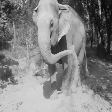

In [13]:
max_pooled = max_pooling(pools=img_pools)
max_pooled

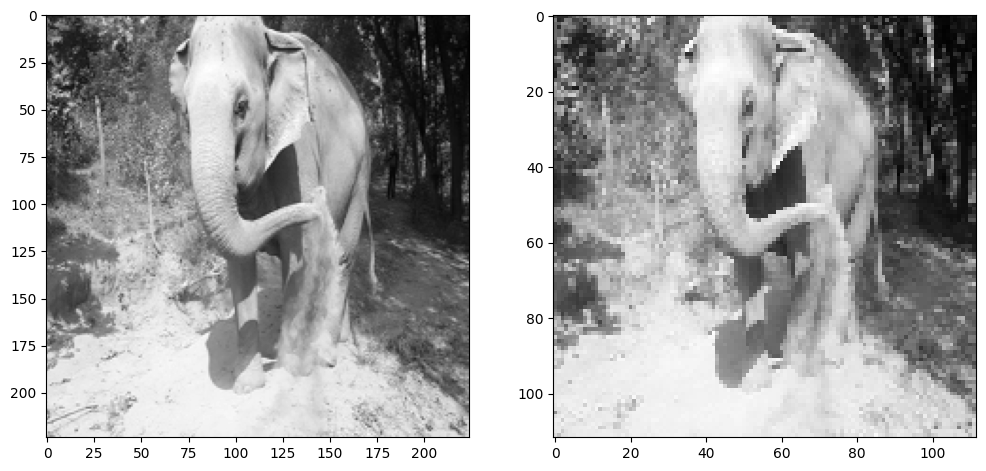

In [14]:
plot_two_images(img1=img, img2=max_pooled)

#convert to 0-1

In [15]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)

In [16]:
#resize all the images to the same size
test_data = train_datagen.flow_from_directory(
    directory='/content/dataset/test/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

Found 188 images belonging to 2 classes.


In [17]:
first_batch = test_data.next()

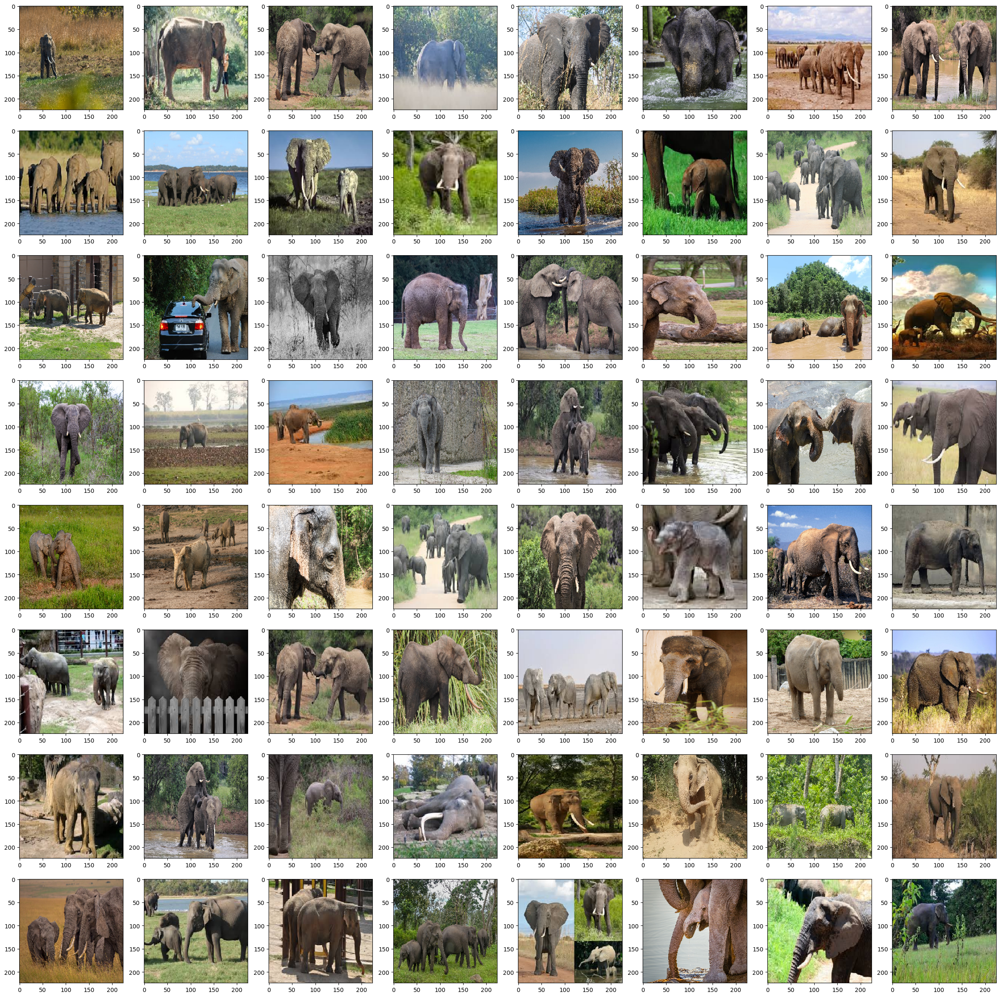

In [18]:
def visualize_batch(batch: tf.keras.preprocessing.image.DirectoryIterator):
    n = 64
    num_row, num_col = 8, 8
    fig, axes = plt.subplots(num_row, num_col, figsize=(3 * num_col, 3 * num_row))

    for i in range(n):
        img = np.array(batch[0][i] * 255, dtype='uint8')
        ax = axes[i // num_col, i % num_col]
        ax.imshow(img)

    plt.tight_layout()
    plt.show()


visualize_batch(batch=first_batch)

In [19]:
train_data = train_datagen.flow_from_directory(
    directory='/content/dataset/train',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

Found 840 images belonging to 2 classes.


#1st model implementation

In [20]:
model_1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3, 3), input_shape=(224, 224, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')
])

model_1.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy')]
)

history_1 = model_1.fit(
    train_data,
    validation_data=test_data,
    epochs=10
)

Epoch 1/10
14/14 [==============================] - 9s 433ms/step - loss: 19.9902 - accuracy: 0.5226 - val_loss: 21.2104 - val_accuracy: 0.4840
Epoch 2/10
14/14 [==============================] - 4s 302ms/step - loss: 9.3698 - accuracy: 0.4631 - val_loss: 3.6923 - val_accuracy: 0.4840
Epoch 3/10
14/14 [==============================] - 7s 521ms/step - loss: 1.7404 - accuracy: 0.5619 - val_loss: 0.7157 - val_accuracy: 0.6596
Epoch 4/10
14/14 [==============================] - 4s 298ms/step - loss: 0.5255 - accuracy: 0.7381 - val_loss: 0.6238 - val_accuracy: 0.6489
Epoch 5/10
14/14 [==============================] - 4s 294ms/step - loss: 0.3937 - accuracy: 0.8869 - val_loss: 0.5421 - val_accuracy: 0.6968
Epoch 6/10
14/14 [==============================] - 5s 362ms/step - loss: 0.3124 - accuracy: 0.8952 - val_loss: 0.5131 - val_accuracy: 0.7287
Epoch 7/10
14/14 [==============================] - 4s 309ms/step - loss: 0.2428 - accuracy: 0.9202 - val_loss: 0.5335 - val_accuracy: 0.7713
Epoc

#2nd model best val_accuracy so far

In [21]:
model_2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), input_shape=(224, 224, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')
])

model_2.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy')]
)

history_2 = model_2.fit(
    train_data,
    validation_data=test_data,
    epochs=10
)

Epoch 1/10
14/14 [==============================] - 9s 556ms/step - loss: 18.1913 - accuracy: 0.5000 - val_loss: 3.9263 - val_accuracy: 0.5532
Epoch 2/10
14/14 [==============================] - 4s 303ms/step - loss: 3.1781 - accuracy: 0.5321 - val_loss: 1.7258 - val_accuracy: 0.6277
Epoch 3/10
14/14 [==============================] - 4s 308ms/step - loss: 1.1416 - accuracy: 0.6333 - val_loss: 0.6097 - val_accuracy: 0.7128
Epoch 4/10
14/14 [==============================] - 5s 354ms/step - loss: 0.4096 - accuracy: 0.8071 - val_loss: 0.4513 - val_accuracy: 0.7553
Epoch 5/10
14/14 [==============================] - 4s 304ms/step - loss: 0.2766 - accuracy: 0.8917 - val_loss: 0.4570 - val_accuracy: 0.8085
Epoch 6/10
14/14 [==============================] - 6s 477ms/step - loss: 0.2142 - accuracy: 0.9274 - val_loss: 0.4042 - val_accuracy: 0.7979
Epoch 7/10
14/14 [==============================] - 4s 301ms/step - loss: 0.1794 - accuracy: 0.9345 - val_loss: 0.4474 - val_accuracy: 0.8138
Epoch

#3rd model

In [23]:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), input_shape=(224, 224, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')
])

model_3.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy')]
)

history_3 = model_3.fit(
    train_data,
    validation_data=test_data,
    epochs=10
)

Epoch 1/10
14/14 [==============================] - 12s 469ms/step - loss: 2.1365 - accuracy: 0.4929 - val_loss: 0.6905 - val_accuracy: 0.5000
Epoch 2/10
14/14 [==============================] - 4s 301ms/step - loss: 0.6911 - accuracy: 0.5333 - val_loss: 0.6690 - val_accuracy: 0.5957
Epoch 3/10
14/14 [==============================] - 6s 459ms/step - loss: 0.6762 - accuracy: 0.6119 - val_loss: 0.6430 - val_accuracy: 0.7128
Epoch 4/10
14/14 [==============================] - 7s 541ms/step - loss: 0.6463 - accuracy: 0.7238 - val_loss: 0.5939 - val_accuracy: 0.6543
Epoch 5/10
14/14 [==============================] - 5s 363ms/step - loss: 0.5599 - accuracy: 0.7143 - val_loss: 0.8155 - val_accuracy: 0.5372
Epoch 6/10
14/14 [==============================] - 4s 319ms/step - loss: 0.4741 - accuracy: 0.7821 - val_loss: 0.5287 - val_accuracy: 0.7606
Epoch 7/10
14/14 [==============================] - 4s 306ms/step - loss: 0.3608 - accuracy: 0.8452 - val_loss: 0.6142 - val_accuracy: 0.6809
Epoch

#prediction


In [24]:
def prepare_single_image(img_path: str) -> np.array:
    img = Image.open(img_path)
    img = img.resize(size=(224, 224))
    return np.array(img) / 255.0

In [35]:
single_image = prepare_single_image(img_path='/content/dataset/test/Asian/as_te16.jpg')
single_prediction = model_2.predict(single_image.reshape(-1, 224, 224, 3))
single_prediction

1/1 [==============================] - 0s 112ms/step


array([[0.021507  , 0.97849303]], dtype=float32)

In [36]:
# Define a dictionary mapping class indices to class labels
class_labels = {0: "African Elephant", 1: "Asian Elephant"}

# Convert the predicted probabilities to class labels
predicted_class = np.argmax(single_prediction)

# Get the corresponding label from the dictionary
predicted_label = class_labels[predicted_class]

print("Predicted Label:", predicted_label)

Predicted Label: Asian Elephant


In [38]:
single_image = prepare_single_image(img_path='/content/dataset/test/African/af_te25.jpg')
single_prediction = model_2.predict(single_image.reshape(-1, 224, 224, 3))
single_prediction

1/1 [==============================] - 0s 101ms/step


array([[0.9154071 , 0.08459284]], dtype=float32)

In [39]:
# Define a dictionary mapping class indices to class labels
class_labels = {0: "African Elephant", 1: "Asian Elephant"}

# Convert the predicted probabilities to class labels
predicted_class = np.argmax(single_prediction)

# Get the corresponding label from the dictionary
predicted_label = class_labels[predicted_class]

print("Predicted Label:", predicted_label)

Predicted Label: African Elephant


#save the model

In [40]:
model_2.save('Elephant_model.h5')

#image upload and prediction of the class.

Saving asian_elephant.jpg to asian_elephant.jpg
User uploaded file "asian_elephant.jpg" with length 130044 bytes
1/1 [==============================] - 0s 62ms/step
Prediction: Asian Elephant


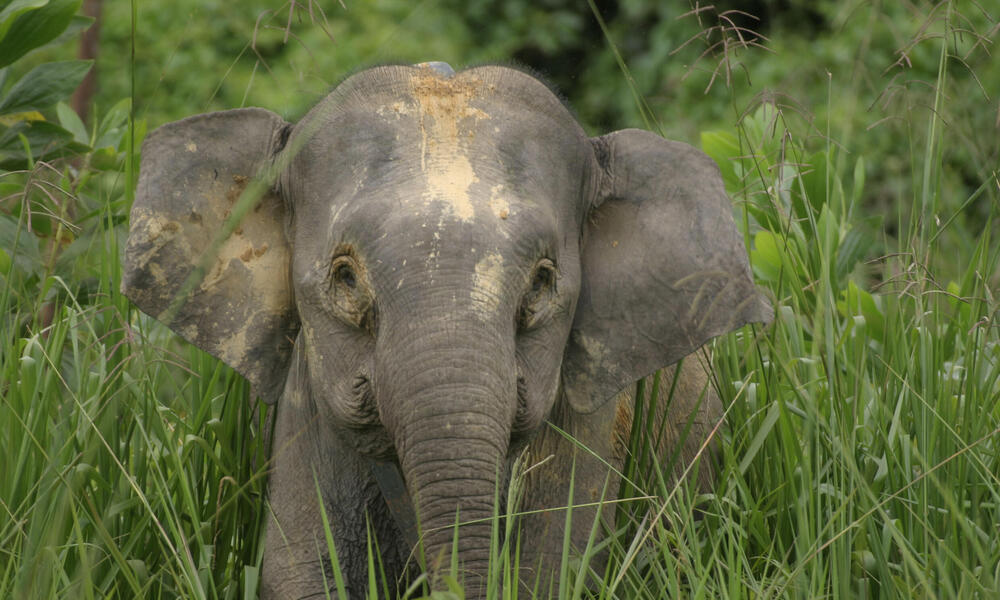

In [46]:
#code will ask the user for an image, run the prediction
#then it will display the image for the user and finally remove it usin os.remove
#efficiently saving the storage space

import numpy as np
from PIL import Image
import tensorflow as tf
import matplotlib.pyplot as plt

# Load your trained model
model = tf.keras.models.load_model('/content/Elephant_model.h5')

# Define class labels
class_labels = {0: "African Elephant", 1: "Asian Elephant"}

# Function to preprocess the uploaded image
def preprocess_image(image):
    img = Image.open(image)
    # Resize image to match model input size
    img = img.resize((224, 224))
    # Normalize pixel values
    img = np.array(img) / 255.0
    # Add batch dimension
    img = np.expand_dims(img, axis=0)
    return img

# Function to run prediction on the preprocessed image
def predict_image(image):
    img = preprocess_image(image)
    predictions = model.predict(img)
    predicted_class = np.argmax(predictions)
    predicted_label = class_labels[predicted_class]
    return predicted_label

# File upload function
def upload_file():
    from google.colab import files
    uploaded = files.upload()
    for filename in uploaded.keys():
        print('User uploaded file "{name}" with length {length} bytes'.format(
            name=filename, length=len(uploaded[filename])))
        # Run prediction on the uploaded image
        prediction = predict_image(filename)
        print("Prediction:", prediction)
        # Display the uploaded image
        display(Image.open(filename))
        # Delete the uploaded image file
        os.remove(filename)

# Call the upload function
upload_file()